<a href="https://colab.research.google.com/github/Bregella/Bregella/blob/main/QuickDA%2BAG_Case4final2410.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
#для проверки включения GPU (среда выполнения -> сменить среду выполнения -> аппартаный ускоритель GPU)
%tensorflow_version 2.x
import tensorflow as tf
device_name = tf.test.gpu_device_name()
if device_name != '/device:GPU:0':
  raise SystemError('GPU device not found')
print('Found GPU at: {}'.format(device_name))

Colab only includes TensorFlow 2.x; %tensorflow_version has no effect.
Found GPU at: /device:GPU:0


In [ ]:
!pip install pandas-profiling

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
!pip install https://github.com/pandas-profiling/pandas-profiling/archive/master.zip
#после перезагрузить ядро и выполнить еще раз

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Using cached https://github.com/pandas-profiling/pandas-profiling/archive/master.zip (22.0 MB)


In [ ]:
!pip install quickda

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Created wheel for ppscore: filename=ppscore-1.3.0-py2.py3-none-any.whl size=13167 sha256=ba82c5a1d487720c57f3e1512c5665ab7b7b01afdbaa3f871208df0e0e7a283c
  Stored in directory: /root/.cache/pip/wheels/df/f9/57/05d08363f49803608cd482928dce0a93d3aedcaddd3007c97d
Successfully built ppscore


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import scipy.stats as spy
import seaborn as sns

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
df = pd.read_csv('/content/drive/MyDrive/MyWork/Case4_Enrich.csv')
df.head()

,OrderDate,OrderDateQuarter,OrderDateMonth,OrderDateYear,Margin,Profit,Order_Quantity,Unit_Price,Total_Unit_Cost,OrderNumber,...,Sales,City,Country,Region_Sales,Region_Group,Full_Name,Customer_Names,Customer_Sales,Product_Name,Product_Sales
0,22.07.2014,01.07.2014,01.07.2014,01.01.2014,243.746,1218.73,5,716.9,473.154,SO - 000532,...,3584.5,Dusseldorf,Germany,2374124.9,Top Regions,"Dusseldorf, Germany",Mylan Corp,2688361.6,Product 2,22913892.8
1,22.09.2016,01.07.2016,01.09.2016,01.01.2016,3154.360,15771.80,5,5735.2,2580.840,SO - 0007231,...,28676.0,Zaporozhye,Ukraine,2427322.9,Top Regions,"Zaporozhye, Ukraine",ETUDE Ltd,3288018.3,Product 5,17047098.1
2,02.04.2016,01.04.2016,01.04.2016,01.01.2016,2064.672,10323.36,5,5735.2,3670.528,SO - 0005753,...,28676.0,WIEN (Vienna),Austria,1866861.2,Lower Regions,"WIEN (Vienna), Austria",U.S. Ltd,2938130.9,Product 7,25715986.9
3,30.03.2016,01.01.2016,01.03.2016,01.01.2016,426.790,2133.95,5,871.0,444.210,SO - 0005728,...,4355.0,STOCKHOLM,Sweden,2287071.8,Top Regions,"STOCKHOLM, Sweden",Ei,3273653.5,Product 5,17047098.1
4,16.02.2016,01.01.2016,01.02.2016,01.01.2016,505.180,2525.90,5,871.0,365.820,SO - 0005362,...,4355.0,Glasgow,UK,2394050.7,Top Regions,"Glasgow, UK","3LAB, Ltd",2756440.3,Product 1,25571548.3


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7991 entries, 0 to 7990
Data columns (total 22 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   OrderDate         7991 non-null   object 
 1   OrderDateQuarter  7991 non-null   object 
 2   OrderDateMonth    7991 non-null   object 
 3   OrderDateYear     7991 non-null   object 
 4   Margin            7991 non-null   float64
 5   Profit            7991 non-null   float64
 6   Order_Quantity    7991 non-null   int64  
 7   Unit_Price        7991 non-null   float64
 8   Total_Unit_Cost   7991 non-null   float64
 9   OrderNumber       7991 non-null   object 
 10  Channel           7991 non-null   object 
 11  Warehouse_Code    7991 non-null   object 
 12  Sales             7991 non-null   float64
 13  City              7991 non-null   object 
 14  Country           7991 non-null   object 
 15  Region_Sales      7991 non-null   float64
 16  Region_Group      7991 non-null   object 


In [ ]:
df['OrderDate'] = pd.to_datetime(df['OrderDate'])

In [ ]:
df['OrderDateQuarter'] = pd.to_datetime(df['OrderDateQuarter'])

In [ ]:
df['OrderDateMonth'] = pd.to_datetime(df['OrderDateMonth'])

In [ ]:
df['OrderDateYear'] = pd.to_datetime(df['OrderDateYear'])

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7991 entries, 0 to 7990
Data columns (total 22 columns):
 #   Column            Non-Null Count  Dtype         
---  ------            --------------  -----         
 0   OrderDate         7991 non-null   datetime64[ns]
 1   OrderDateQuarter  7991 non-null   datetime64[ns]
 2   OrderDateMonth    7991 non-null   datetime64[ns]
 3   OrderDateYear     7991 non-null   object        
 4   Margin            7991 non-null   float64       
 5   Profit            7991 non-null   float64       
 6   Order_Quantity    7991 non-null   int64         
 7   Unit_Price        7991 non-null   float64       
 8   Total_Unit_Cost   7991 non-null   float64       
 9   OrderNumber       7991 non-null   object        
 10  Channel           7991 non-null   object        
 11  Warehouse_Code    7991 non-null   object        
 12  Sales             7991 non-null   float64       
 13  City              7991 non-null   object        
 14  Country           7991 n

In [ ]:
from quickda.explore_data import *
from quickda.clean_data import *
from quickda.explore_numeric import *
from quickda.explore_categoric import *
from quickda.explore_numeric_categoric import *
from quickda.explore_time_series import *

In [ ]:
explore(df)

,dtypes,count,null_sum,null_pct,nunique,min,25%,50%,75%,max,mean,median,std,skew
Channel,object,7991,0,0.0,3,Distributor,-,-,-,Wholesale,-,-,-,-
City,object,7991,0,0.0,66,AMSTERDAM,-,-,-,Zaragoza,-,-,-,-
Country,object,7991,0,0.0,26,Austria,-,-,-,Ukraine,-,-,-,-
Customer_Names,object,7991,0,0.0,50,21st Ltd,-,-,-,Wuxi Group,-,-,-,-
Customer_Sales,float64,7991,0,0.0,50,2364959.3,2871251.5,3039903.9,3288018.3,4081485.9,3120042.574008,3039903.9,344334.722098,0.642879
Full_Name,object,7991,0,0.0,66,"AMSTERDAM, Netherlands",-,-,-,"Zaragoza, Spain",-,-,-,-
Margin,float64,7991,0,0.0,4902,25.125,335.134,601.66,1199.434,3863.22,852.625449,601.66,727.763554,1.392873
OrderDate,datetime64[ns],7991,0,0.0,945,2014-01-06 00:00:00,-,-,-,2016-12-31 00:00:00,-,-,-,-
OrderDateMonth,datetime64[ns],7991,0,0.0,31,2014-01-06 00:00:00,-,-,-,2016-01-12 00:00:00,-,-,-,-
OrderDateQuarter,datetime64[ns],7991,0,0.0,11,2014-01-04 00:00:00,-,-,-,2016-01-10 00:00:00,-,-,-,-


In [ ]:
explore(df, method="profile", report_name="Design Report")

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
df.info() #информация по исходному датасету

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7991 entries, 0 to 7990
Data columns (total 22 columns):
 #   Column            Non-Null Count  Dtype         
---  ------            --------------  -----         
 0   OrderDate         7991 non-null   datetime64[ns]
 1   OrderDateQuarter  7991 non-null   datetime64[ns]
 2   OrderDateMonth    7991 non-null   datetime64[ns]
 3   OrderDateYear     7991 non-null   object        
 4   Margin            7991 non-null   float64       
 5   Profit            7991 non-null   float64       
 6   Order_Quantity    7991 non-null   int64         
 7   Unit_Price        7991 non-null   float64       
 8   Total_Unit_Cost   7991 non-null   float64       
 9   OrderNumber       7991 non-null   object        
 10  Channel           7991 non-null   object        
 11  Warehouse_Code    7991 non-null   object        
 12  Sales             7991 non-null   float64       
 13  City              7991 non-null   object        
 14  Country           7991 n

In [ ]:
df = clean(df, method='dropcols', columns=['OrderDateQuarter', 'OrderDateMonth', 'OrderDateYear', 'Margin', 'Profit', 'Unit_Price', 'City', 'Region_Sales', 'Full_Name', 'Customer_Sales', 'Product_Sales'])

In [ ]:
df.head()

,OrderDate,Order_Quantity,Total_Unit_Cost,OrderNumber,Channel,Warehouse_Code,Sales,Country,Region_Group,Customer_Names,Product_Name
0,2014-07-22,5,473.154,SO - 000532,Distributor,NXH382,3584.5,Germany,Top Regions,Mylan Corp,Product 2
1,2016-09-22,5,2580.840,SO - 0007231,Export,AXW291,28676.0,Ukraine,Top Regions,ETUDE Ltd,Product 5
2,2016-02-04,5,3670.528,SO - 0005753,Wholesale,AXW291,28676.0,Austria,Lower Regions,U.S. Ltd,Product 7
3,2016-03-30,5,444.210,SO - 0005728,Distributor,GUT930,4355.0,Sweden,Top Regions,Ei,Product 5
4,2016-02-16,5,365.820,SO - 0005362,Export,NXH382,4355.0,UK,Top Regions,"3LAB, Ltd",Product 1


In [ ]:
df.shape #размерность датафрейма

(7991, 11)

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7991 entries, 0 to 7990
Data columns (total 11 columns):
 #   Column           Non-Null Count  Dtype         
---  ------           --------------  -----         
 0   OrderDate        7991 non-null   datetime64[ns]
 1   Order_Quantity   7991 non-null   int64         
 2   Total_Unit_Cost  7991 non-null   float64       
 3   OrderNumber      7991 non-null   object        
 4   Channel          7991 non-null   object        
 5   Warehouse_Code   7991 non-null   object        
 6   Sales            7991 non-null   float64       
 7   Country          7991 non-null   object        
 8   Region_Group     7991 non-null   object        
 9   Customer_Names   7991 non-null   object        
 10  Product_Name     7991 non-null   object        
dtypes: datetime64[ns](1), float64(2), int64(1), object(7)
memory usage: 686.9+ KB


In [ ]:
explore(df)

,dtypes,count,null_sum,null_pct,nunique,min,25%,50%,75%,max,mean,median,std,skew
Channel,object,7991,0,0.0,3,Distributor,-,-,-,Wholesale,-,-,-,-
Country,object,7991,0,0.0,26,Austria,-,-,-,Ukraine,-,-,-,-
Customer_Names,object,7991,0,0.0,50,21st Ltd,-,-,-,Wuxi Group,-,-,-,-
OrderDate,datetime64[ns],7991,0,0.0,945,2014-01-06 00:00:00,-,-,-,2016-12-31 00:00:00,-,-,-,-
OrderNumber,object,7991,0,0.0,7991,SO - 0001000,-,-,-,SO - 000999,-,-,-,-
Order_Quantity,int64,7991,0,0.0,8,5,6.0,8.0,10.0,12,8.456889,8.0,2.283776,0.01788
Product_Name,object,7991,0,0.0,14,Product 1,-,-,-,Product 9,-,-,-,-
Region_Group,object,7991,0,0.0,3,Lower Regions,-,-,-,Top Regions,-,-,-,-
Sales,float64,7991,0,0.0,2419,837.5,7959.6,13989.6,27436.5,78711.6,19343.403904,13989.6,15586.133406,1.229094
Total_Unit_Cost,float64,7991,0,0.0,5252,68.675,606.1155,1080.576,2040.2505,5498.556,1431.911054,1080.576,1112.413043,1.091634


Outlier Analysis - Boxplot


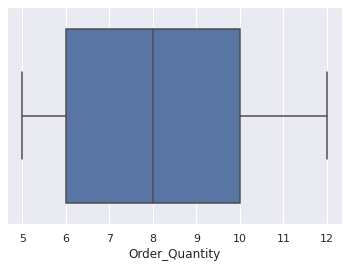

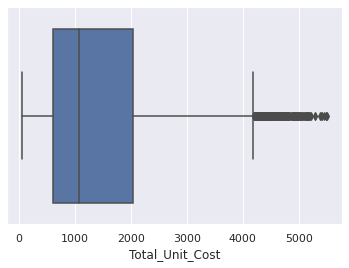

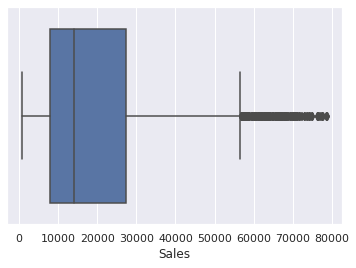

Distribution Analysis - Histogram


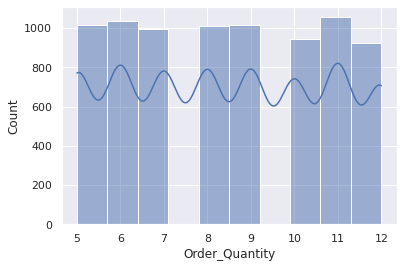

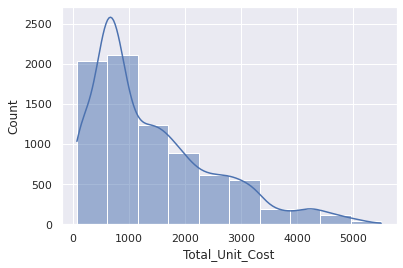

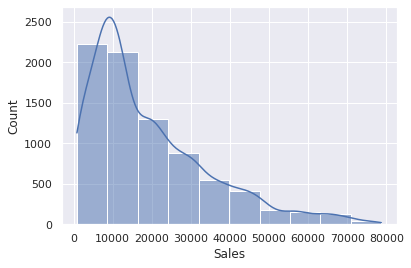

In [ ]:
eda_num(df)

In [ ]:
eda_num(df, method="correlation")

Correlation Analysis - Heatmap


/usr/local/lib/python3.7/dist-packages/quickda/explore_numeric.py:30: FutureWarning:

this method is deprecated in favour of `Styler.format(precision=..)`



,Order_Quantity,Total_Unit_Cost,Sales
Order_Quantity,1.00,0.00,0.34
Total_Unit_Cost,0.00,1.00,0.86
Sales,0.34,0.86,1.00


Bar Plot of Channel with respect to Product_Name


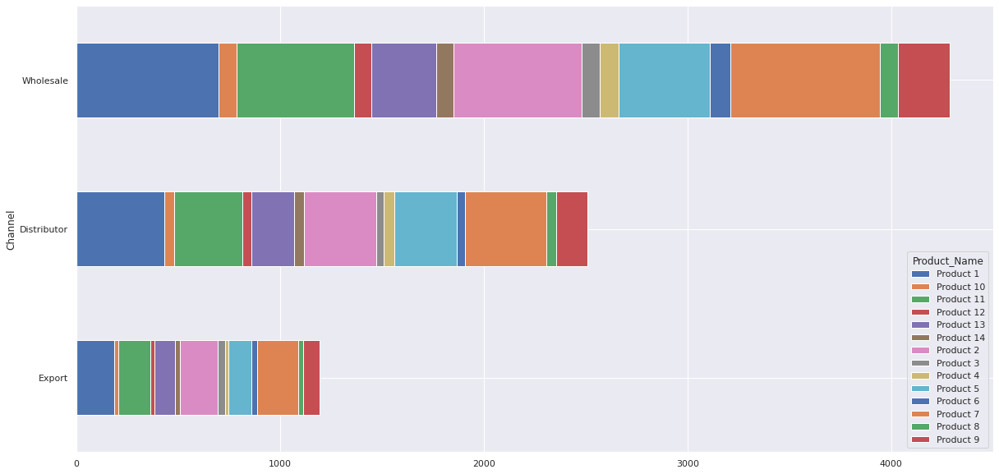

Crosstabulation of Channel across Product_Name


Product_Name,Product 1,Product 10,Product 11,Product 12,Product 13,Product 14,Product 2,Product 3,Product 4,Product 5,Product 6,Product 7,Product 8,Product 9
Channel,,,,,,,,,,,,,,
Wholesale,0.16,0.02,0.13,0.02,0.07,0.02,0.15,0.02,0.02,0.10,0.02,0.17,0.02,0.06
Distributor,0.17,0.02,0.13,0.02,0.08,0.02,0.14,0.01,0.02,0.12,0.02,0.16,0.02,0.06
Export,0.15,0.02,0.13,0.02,0.08,0.02,0.15,0.03,0.02,0.09,0.02,0.17,0.02,0.07


In [ ]:
eda_cat(df, x='Channel',y='Product_Name')

Scatterplot of Sales versus Product_Name


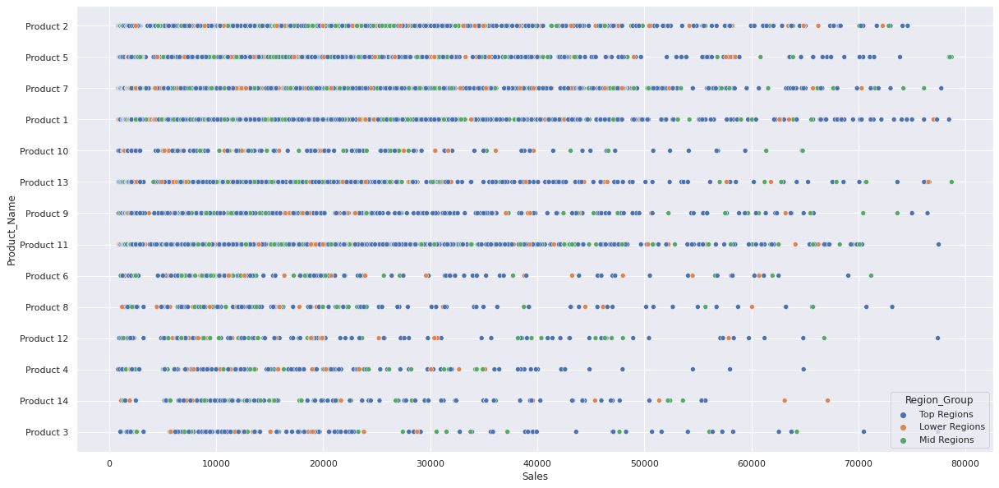

In [ ]:
eda_numcat(df, x='Sales', y='Product_Name', 
           hue='Region_Group', method='relationship')

Violinplot of numerical feature Sales across categorical feature Sales


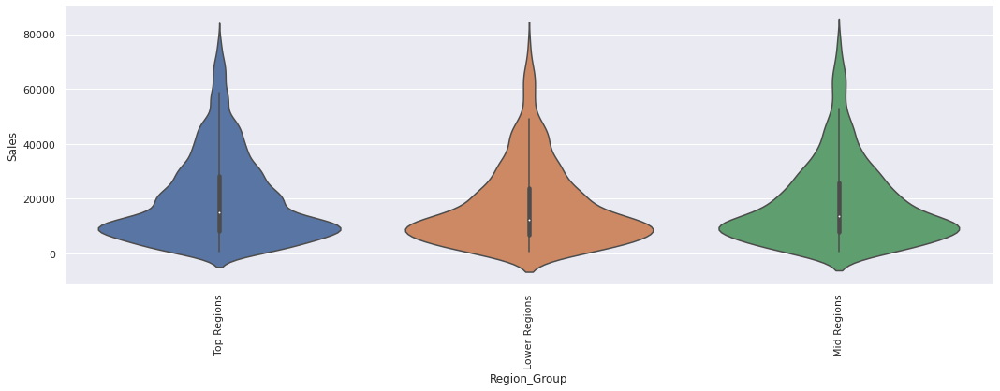

In [ ]:
eda_numcat(df, x='Region_Group', y='Sales', method='comparison')

Violinplot of numerical feature Sales across categorical feature Sales


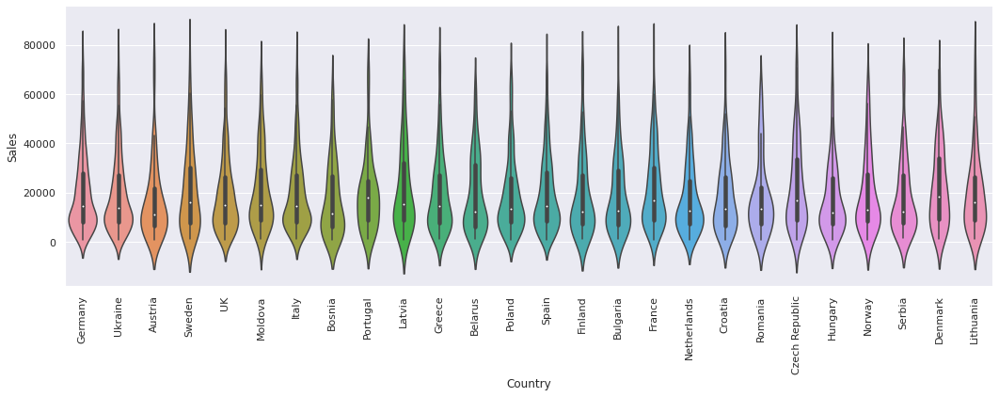

In [ ]:
eda_numcat(df, x='Country', y='Sales', method='comparison')

Violinplot of numerical feature Sales across categorical feature Sales


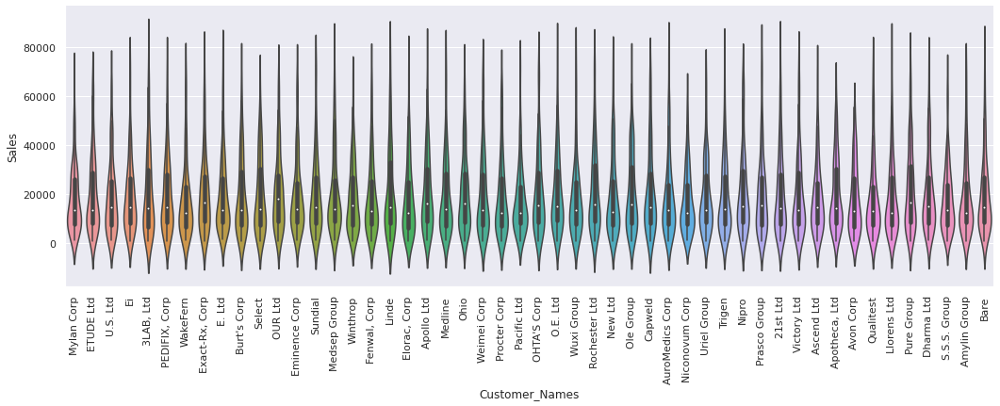

In [ ]:
eda_numcat(df, x='Customer_Names', y='Sales', method='comparison')

Violinplot of numerical feature Sales across categorical feature Sales


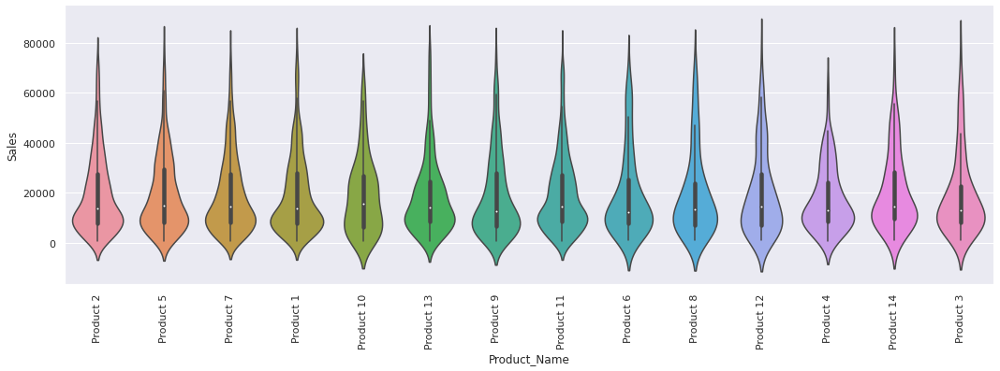

In [ ]:
eda_numcat(df, x='Product_Name', y='Sales', method='comparison')

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7991 entries, 0 to 7990
Data columns (total 11 columns):
 #   Column           Non-Null Count  Dtype         
---  ------           --------------  -----         
 0   OrderDate        7991 non-null   datetime64[ns]
 1   Order_Quantity   7991 non-null   int64         
 2   Total_Unit_Cost  7991 non-null   float64       
 3   OrderNumber      7991 non-null   object        
 4   Channel          7991 non-null   object        
 5   Warehouse_Code   7991 non-null   object        
 6   Sales            7991 non-null   float64       
 7   Country          7991 non-null   object        
 8   Region_Group     7991 non-null   object        
 9   Customer_Names   7991 non-null   object        
 10  Product_Name     7991 non-null   object        
dtypes: datetime64[ns](1), float64(2), int64(1), object(7)
memory usage: 686.9+ KB


Сформируем подвыборки для обучения моделей

In [ ]:
train, validate, test = np.split(df, [int(.7*len(df)), int(.85*len(df))])

In [ ]:
#train, test =  np.split(df, [int(.8*len(df))])

In [ ]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5593 entries, 0 to 5592
Data columns (total 11 columns):
 #   Column           Non-Null Count  Dtype         
---  ------           --------------  -----         
 0   OrderDate        5593 non-null   datetime64[ns]
 1   Order_Quantity   5593 non-null   int64         
 2   Total_Unit_Cost  5593 non-null   float64       
 3   OrderNumber      5593 non-null   object        
 4   Channel          5593 non-null   object        
 5   Warehouse_Code   5593 non-null   object        
 6   Sales            5593 non-null   float64       
 7   Country          5593 non-null   object        
 8   Region_Group     5593 non-null   object        
 9   Customer_Names   5593 non-null   object        
 10  Product_Name     5593 non-null   object        
dtypes: datetime64[ns](1), float64(2), int64(1), object(7)
memory usage: 480.8+ KB


In [ ]:
test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1199 entries, 6792 to 7990
Data columns (total 11 columns):
 #   Column           Non-Null Count  Dtype         
---  ------           --------------  -----         
 0   OrderDate        1199 non-null   datetime64[ns]
 1   Order_Quantity   1199 non-null   int64         
 2   Total_Unit_Cost  1199 non-null   float64       
 3   OrderNumber      1199 non-null   object        
 4   Channel          1199 non-null   object        
 5   Warehouse_Code   1199 non-null   object        
 6   Sales            1199 non-null   float64       
 7   Country          1199 non-null   object        
 8   Region_Group     1199 non-null   object        
 9   Customer_Names   1199 non-null   object        
 10  Product_Name     1199 non-null   object        
dtypes: datetime64[ns](1), float64(2), int64(1), object(7)
memory usage: 103.2+ KB


In [ ]:
validate.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1199 entries, 5593 to 6791
Data columns (total 11 columns):
 #   Column           Non-Null Count  Dtype         
---  ------           --------------  -----         
 0   OrderDate        1199 non-null   datetime64[ns]
 1   Order_Quantity   1199 non-null   int64         
 2   Total_Unit_Cost  1199 non-null   float64       
 3   OrderNumber      1199 non-null   object        
 4   Channel          1199 non-null   object        
 5   Warehouse_Code   1199 non-null   object        
 6   Sales            1199 non-null   float64       
 7   Country          1199 non-null   object        
 8   Region_Group     1199 non-null   object        
 9   Customer_Names   1199 non-null   object        
 10  Product_Name     1199 non-null   object        
dtypes: datetime64[ns](1), float64(2), int64(1), object(7)
memory usage: 103.2+ KB


In [ ]:
train.to_csv('/content/drive/MyDrive/MyWork/Case4_train.csv')

In [ ]:
test.to_csv('/content/drive/MyDrive/MyWork/Case4_test.csv')

In [ ]:
validate.to_csv('/content/drive/MyDrive/MyWork/Case4_validate.csv')

Установка **AutoGlion**

In [ ]:
! pip install mxnet autogluon

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
from autogluon.tabular import TabularDataset, TabularPredictor

In [ ]:
train_data = TabularDataset('/content/drive/MyDrive/MyWork/Case4_train.csv')
train_data.head()

,Unnamed: 0,OrderDate,Order_Quantity,Total_Unit_Cost,OrderNumber,Channel,Warehouse_Code,Sales,Country,Region_Group,Customer_Names,Product_Name
0,0,2014-07-22,5,473.154,SO - 000532,Distributor,NXH382,3584.5,Germany,Top Regions,Mylan Corp,Product 2
1,1,2016-09-22,5,2580.840,SO - 0007231,Export,AXW291,28676.0,Ukraine,Top Regions,ETUDE Ltd,Product 5
2,2,2016-02-04,5,3670.528,SO - 0005753,Wholesale,AXW291,28676.0,Austria,Lower Regions,U.S. Ltd,Product 7
3,3,2016-03-30,5,444.210,SO - 0005728,Distributor,GUT930,4355.0,Sweden,Top Regions,Ei,Product 5
4,4,2016-02-16,5,365.820,SO - 0005362,Export,NXH382,4355.0,UK,Top Regions,"3LAB, Ltd",Product 1


In [ ]:
train_data.info()

<class 'autogluon.core.dataset.TabularDataset'>
RangeIndex: 5593 entries, 0 to 5592
Data columns (total 12 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Unnamed: 0       5593 non-null   int64  
 1   OrderDate        5593 non-null   object 
 2   Order_Quantity   5593 non-null   int64  
 3   Total_Unit_Cost  5593 non-null   float64
 4   OrderNumber      5593 non-null   object 
 5   Channel          5593 non-null   object 
 6   Warehouse_Code   5593 non-null   object 
 7   Sales            5593 non-null   float64
 8   Country          5593 non-null   object 
 9   Region_Group     5593 non-null   object 
 10  Customer_Names   5593 non-null   object 
 11  Product_Name     5593 non-null   object 
dtypes: float64(2), int64(2), object(8)
memory usage: 524.5+ KB


In [ ]:
label = 'Sales'
print("Summary of Sales variable: \n", train_data[label].describe())

Summary of Sales variable: 
 count     5593.000000
mean     16299.928428
std      12867.607120
min        837.500000
25%       6713.400000
50%      12093.500000
75%      23215.500000
max      65057.000000
Name: Sales, dtype: float64


In [ ]:
save_path = 'agModels-predictSales'  # specifies folder to store trained models
predictor = TabularPredictor(label=label, path=save_path).fit(train_data)

INFO:autogluon.tabular.learner.default_learner:Beginning AutoGluon training ...
INFO:autogluon.tabular.learner.default_learner:AutoGluon will save models to "agModels-predictSales/"
INFO:autogluon.tabular.learner.default_learner:AutoGluon Version:  0.5.2
INFO:autogluon.tabular.learner.default_learner:Python Version:     3.7.15
INFO:autogluon.tabular.learner.default_learner:Operating System:   Linux
INFO:autogluon.tabular.learner.default_learner:Train Data Rows:    5593
INFO:autogluon.tabular.learner.default_learner:Train Data Columns: 11
INFO:autogluon.tabular.learner.default_learner:Label Column: Sales
INFO:autogluon.tabular.learner.default_learner:Preprocessing data ...
Level 25:autogluon.core.utils.utils:AutoGluon infers your prediction problem is: 'regression' (because dtype of label-column == float and many unique label-values observed).
INFO:autogluon.core.utils.utils:	Label info (max, min, mean, stddev): (65057.0, 837.5, 16299.92843, 12867.60712)
Level 25:autogluon.core.utils.ut

In [ ]:
test_data = TabularDataset('/content/drive/MyDrive/MyWork/Case4_test.csv')
y_test = test_data[label]  # values to predict
test_data_nolab = test_data.drop(columns=[label])  # delete label column to prove we're not cheating
test_data_nolab.head()

INFO:autogluon.common.loaders.load_pd:Loaded data from: /content/drive/MyDrive/MyWork/Case4_test.csv | Columns = 12 / 12 | Rows = 1199 -> 1199


,Unnamed: 0,OrderDate,Order_Quantity,Total_Unit_Cost,OrderNumber,Channel,Warehouse_Code,Country,Region_Group,Customer_Names,Product_Name
0,6792,2016-07-21,11,601.392,SO - 0006702,Wholesale,GUT930,Greece,Top Regions,Medline,Product 2
1,6793,2016-10-02,11,419.152,SO - 0005304,Wholesale,GUT930,Poland,Top Regions,Wuxi Group,Product 8
2,6794,2015-09-12,11,774.520,SO - 0004775,Wholesale,GUT930,Greece,Lower Regions,Wuxi Group,Product 11
3,6795,2015-06-15,11,628.728,SO - 0003345,Wholesale,GUT930,Netherlands,Top Regions,Medsep Group,Product 2
4,6796,2016-07-19,11,1221.008,SO - 0006686,Distributor,NXH382,Lithuania,Top Regions,Ei,Product 1


In [ ]:
test_data.info()

<class 'autogluon.core.dataset.TabularDataset'>
RangeIndex: 1199 entries, 0 to 1198
Data columns (total 12 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Unnamed: 0       1199 non-null   int64  
 1   OrderDate        1199 non-null   object 
 2   Order_Quantity   1199 non-null   int64  
 3   Total_Unit_Cost  1199 non-null   float64
 4   OrderNumber      1199 non-null   object 
 5   Channel          1199 non-null   object 
 6   Warehouse_Code   1199 non-null   object 
 7   Sales            1199 non-null   float64
 8   Country          1199 non-null   object 
 9   Region_Group     1199 non-null   object 
 10  Customer_Names   1199 non-null   object 
 11  Product_Name     1199 non-null   object 
dtypes: float64(2), int64(2), object(8)
memory usage: 112.5+ KB


In [ ]:
predictor = TabularPredictor.load(save_path)  # unnecessary, just demonstrates how to load previously-trained predictor from file

y_pred = predictor.predict(test_data_nolab)
print("Predictions:  \n", y_pred)
perf = predictor.evaluate_predictions(y_true=y_test, y_pred=y_pred, auxiliary_metrics=True)

INFO:autogluon.tabular.learner.abstract_learner:Evaluation: root_mean_squared_error on test data: -8429.487336611332
INFO:autogluon.tabular.learner.abstract_learner:	Note: Scores are always higher_is_better. This metric score can be multiplied by -1 to get the metric value.
INFO:autogluon.tabular.learner.abstract_learner:Evaluations on test data:
INFO:autogluon.tabular.learner.abstract_learner:{
    "root_mean_squared_error": -8429.487336611332,
    "mean_squared_error": -71056256.7580908,
    "mean_absolute_error": -5619.612565891499,
    "r2": 0.810448343834246,
    "pearsonr": 0.9445648329925489,
    "median_absolute_error": -3486.5679687500015
}


Predictions:  
 0       14354.674805
1       11656.125977
2       15610.726562
3       14020.454102
4       22119.794922
            ...     
1194    14909.828125
1195    17178.669922
1196    13746.792969
1197    14536.302734
1198    40240.300781
Name: Sales, Length: 1199, dtype: float32


In [ ]:
#predictor.leaderboard(test_data)
predictor.leaderboard(test_data, silent=True)

,model,score_test,score_val,pred_time_test,pred_time_val,fit_time,pred_time_test_marginal,pred_time_val_marginal,fit_time_marginal,stack_level,can_infer,fit_order
0,NeuralNetFastAI,-6770.475545,-4180.103766,0.034731,0.022074,6.617194,0.034731,0.022074,6.617194,1,True,8
1,NeuralNetTorch,-7272.027968,-4379.053571,0.034284,0.020173,8.795099,0.034284,0.020173,8.795099,1,True,10
2,ExtraTreesMSE,-8184.641576,-3848.254601,0.212349,0.106174,2.710906,0.212349,0.106174,2.710906,1,True,7
3,CatBoost,-8322.164078,-3742.847544,0.013868,0.010443,8.463569,0.013868,0.010443,8.463569,1,True,6
4,RandomForestMSE,-8361.603273,-3942.024131,0.210698,0.106713,5.897001,0.210698,0.106713,5.897001,1,True,5
5,WeightedEnsemble_L2,-8429.487337,-3737.362762,0.377916,0.231628,12.710156,0.009365,0.000504,0.350731,2,True,12
6,LightGBMXT,-8574.391324,-4037.895484,0.023947,0.012024,1.791068,0.023947,0.012024,1.791068,1,True,3
7,LightGBM,-8576.995918,-3875.184126,0.012409,0.008276,0.568799,0.012409,0.008276,0.568799,1,True,4
8,XGBoost,-8662.061222,-3931.797757,0.014241,0.008288,1.105070,0.014241,0.008288,1.105070,1,True,9
9,LightGBMLarge,-8926.738777,-3998.197770,0.032707,0.010625,1.166194,0.032707,0.010625,1.166194,1,True,11


In [ ]:
predictor.leaderboard(test_data, extra_metrics=['r2'], silent=True)

,model,score_test,r2,score_val,pred_time_test,pred_time_val,fit_time,pred_time_test_marginal,pred_time_val_marginal,fit_time_marginal,stack_level,can_infer,fit_order
0,NeuralNetFastAI,-6770.475545,0.877718,-4180.103766,0.036273,0.022074,6.617194,0.036273,0.022074,6.617194,1,True,8
1,NeuralNetTorch,-7272.027968,0.858929,-4379.053571,0.034549,0.020173,8.795099,0.034549,0.020173,8.795099,1,True,10
2,ExtraTreesMSE,-8184.641576,0.821300,-3848.254601,0.204545,0.106174,2.710906,0.204545,0.106174,2.710906,1,True,7
3,CatBoost,-8322.164078,0.815244,-3742.847544,0.015505,0.010443,8.463569,0.015505,0.010443,8.463569,1,True,6
4,RandomForestMSE,-8361.603273,0.813489,-3942.024131,0.204721,0.106713,5.897001,0.204721,0.106713,5.897001,1,True,5
5,WeightedEnsemble_L2,-8429.487337,0.810448,-3737.362762,0.369220,0.231628,12.710156,0.009617,0.000504,0.350731,2,True,12
6,LightGBMXT,-8574.391324,0.803875,-4037.895484,0.025205,0.012024,1.791068,0.025205,0.012024,1.791068,1,True,3
7,LightGBM,-8576.995918,0.803756,-3875.184126,0.024178,0.008276,0.568799,0.024178,0.008276,0.568799,1,True,4
8,XGBoost,-8662.061222,0.799844,-3931.797757,0.010984,0.008288,1.105070,0.010984,0.008288,1.105070,1,True,9
9,LightGBMLarge,-8926.738777,0.787426,-3998.197770,0.028384,0.010625,1.166194,0.028384,0.010625,1.166194,1,True,11


Получить доступ к отдельной мдели

In [ ]:
i = 5  # index of model to use
model_to_use = predictor.get_model_names()[i]
model_pred = predictor.predict(test_data, model=model_to_use)
print("Prediction from %s model: %s" % (model_to_use, model_pred.iloc[0]))

Prediction from CatBoost model: 11447.455


In [ ]:
predictor.fit_summary()

*** Summary of fit() ***
Estimated performance of each model:
                  model     score_val  pred_time_val   fit_time  pred_time_val_marginal  fit_time_marginal  stack_level  can_infer  fit_order
0   WeightedEnsemble_L2  -3815.108295       0.257507  22.278530                0.000624           0.442363            2       True         12
1               XGBoost  -3844.535319       0.009032   1.134803                0.009032           1.134803            1       True          9
2              CatBoost  -3881.408672       0.008791   4.168151                0.008791           4.168151            1       True          6
3              LightGBM  -3920.471089       0.008409   0.541461                0.008409           0.541461            1       True          4
4       RandomForestMSE  -3951.075066       0.206697   6.918296                0.206697           6.918296            1       True          5
5         ExtraTreesMSE  -3974.501027       0.105873   3.016237                0.10587

{'model_types': {'KNeighborsUnif': 'KNNModel',
  'KNeighborsDist': 'KNNModel',
  'LightGBMXT': 'LGBModel',
  'LightGBM': 'LGBModel',
  'RandomForestMSE': 'RFModel',
  'CatBoost': 'CatBoostModel',
  'ExtraTreesMSE': 'XTModel',
  'NeuralNetFastAI': 'NNFastAiTabularModel',
  'XGBoost': 'XGBoostModel',
  'NeuralNetTorch': 'TabularNeuralNetTorchModel',
  'LightGBMLarge': 'LGBModel',
  'WeightedEnsemble_L2': 'WeightedEnsembleModel'},
 'model_performance': {'KNeighborsUnif': -14240.806424764918,
  'KNeighborsDist': -12914.87167370894,
  'LightGBMXT': -4217.173399115837,
  'LightGBM': -3920.471089243011,
  'RandomForestMSE': -3951.0750662436053,
  'CatBoost': -3881.408672155859,
  'ExtraTreesMSE': -3974.5010267111393,
  'NeuralNetFastAI': -4370.175397059884,
  'XGBoost': -3844.5353185920962,
  'NeuralNetTorch': -4445.8545237334565,
  'LightGBMLarge': -3992.4507800260753,
  'WeightedEnsemble_L2': -3815.108294751352},
 'model_best': 'WeightedEnsemble_L2',
 'model_paths': {'KNeighborsUnif': 'agMo

In [ ]:
predictor.feature_importance(test_data)

INFO:autogluon.core.utils.utils:Computing feature importance via permutation shuffling for 11 features using 1599 rows with 5 shuffle sets...
INFO:autogluon.core.utils.utils:	22.54s	= Expected runtime (4.51s per shuffle set)
INFO:autogluon.core.utils.utils:	7.59s	= Actual runtime (Completed 5 of 5 shuffle sets)


,importance,stddev,p_value,n,p99_high,p99_low
Total_Unit_Cost,18564.278582,230.627601,2.857753e-09,5,19039.143999,18089.413165
Order_Quantity,11.326913,3.045843,5.712315e-04,5,17.598345,5.055481
Unnamed: 0,9.812242,2.569852,5.164513e-04,5,15.103602,4.520882
Country,5.007715,9.638492,1.549657e-01,5,24.853503,-14.838072
Customer_Names,2.373816,7.532023,2.599249e-01,5,17.882356,-13.134724
Product_Name,1.402639,8.492849,3.653120e-01,5,18.889531,-16.084254
Region_Group,0.368435,3.107569,4.020133e-01,5,6.766963,-6.030093
OrderNumber,-1.137386,0.605310,9.931609e-01,5,0.108954,-2.383727
Channel,-1.835352,3.920038,8.228870e-01,5,6.236061,-9.906765
OrderDate,-6.918230,30.516566,6.805623e-01,5,55.915802,-69.752261


Проверяем модель на новых данных

In [ ]:
predictor._trainer.load_model('CatBoost')

In [ ]:
validate_data = TabularDataset('/content/drive/MyDrive/MyWork/Case4_validate.csv')
validate_data.head()

INFO:autogluon.common.loaders.load_pd:Loaded data from: /content/drive/MyDrive/MyWork/Case4_validate.csv | Columns = 12 / 12 | Rows = 1199 -> 1199


,Unnamed: 0,OrderDate,Order_Quantity,Total_Unit_Cost,OrderNumber,Channel,Warehouse_Code,Sales,Country,Region_Group,Customer_Names,Product_Name
0,5593,2016-04-24,10,1585.019,SO - 0005934,Distributor,AXW291,38659.0,Poland,Mid Regions,Apollo Ltd,Product 1
1,5594,2015-01-30,10,1585.019,SO - 0002212,Distributor,AXW291,38659.0,Spain,Top Regions,"PEDIFIX, Corp",Product 5
2,5595,2014-04-11,10,1816.973,SO - 0001407,Wholesale,AXW291,38659.0,Croatia,Top Regions,O.E. Ltd,Product 7
3,5596,2014-08-31,10,1739.655,SO - 000889,Wholesale,AXW291,38659.0,Germany,Top Regions,Uriel Group,Product 7
4,5597,2014-03-07,10,3416.129,SO - 000368,Wholesale,AXW291,50987.0,Poland,Mid Regions,Avon Corp,Product 7


In [ ]:
y_pred = predictor.predict(validate_data)
print("Predictions:  ", list(y_pred)[:5])
perf = predictor.evaluate(validate_data,)# auxiliary_metrics=False,)

Predictions:   [25668.91015625, 26403.193359375, 29297.916015625, 27808.333984375, 46139.2265625]


INFO:autogluon.tabular.learner.abstract_learner:Evaluation: root_mean_squared_error on test data: -6969.30674393899
INFO:autogluon.tabular.learner.abstract_learner:	Note: Scores are always higher_is_better. This metric score can be multiplied by -1 to get the metric value.
INFO:autogluon.tabular.learner.abstract_learner:Evaluations on test data:
INFO:autogluon.tabular.learner.abstract_learner:{
    "root_mean_squared_error": -6969.30674393899,
    "mean_squared_error": -48571236.49111348,
    "mean_absolute_error": -5149.075419864861,
    "r2": 0.8518019431799524,
    "pearsonr": 0.9396817053260968,
    "median_absolute_error": -3801.9716796875
}


In [ ]:
y_pred

0       25668.910156
1       26403.193359
2       29297.916016
3       27808.333984
4       46139.226562
            ...     
1194     5447.419922
1195     6018.500488
1196     5605.590820
1197     6439.134766
1198     5734.785645
Name: Sales, Length: 1199, dtype: float32

In [ ]:
import numpy as np
import pandas as pd

data=pd.DataFrame()
preds = np.array(y_pred)
data['predict']=y_pred

In [ ]:
data.head(10)

,predict
0,25668.910156
1,26403.193359
2,29297.916016
3,27808.333984
4,46139.226562
5,55533.066406
6,45590.714844
7,13867.940430
8,14110.616211
9,13272.551758


In [ ]:
test_predict = validate_data.join(data)

In [ ]:
test_predict

,Unnamed: 0,OrderDate,Order_Quantity,Total_Unit_Cost,OrderNumber,Channel,Warehouse_Code,Sales,Country,Region_Group,Customer_Names,Product_Name,predict
0,5593,2016-04-24,10,1585.019,SO - 0005934,Distributor,AXW291,38659.0,Poland,Mid Regions,Apollo Ltd,Product 1,25668.910156
1,5594,2015-01-30,10,1585.019,SO - 0002212,Distributor,AXW291,38659.0,Spain,Top Regions,"PEDIFIX, Corp",Product 5,26403.193359
2,5595,2014-04-11,10,1816.973,SO - 0001407,Wholesale,AXW291,38659.0,Croatia,Top Regions,O.E. Ltd,Product 7,29297.916016
3,5596,2014-08-31,10,1739.655,SO - 000889,Wholesale,AXW291,38659.0,Germany,Top Regions,Uriel Group,Product 7,27808.333984
4,5597,2014-03-07,10,3416.129,SO - 000368,Wholesale,AXW291,50987.0,Poland,Mid Regions,Avon Corp,Product 7,46139.226562
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1194,6787,2016-02-15,11,95.676,SO - 0005351,Wholesale,NXH382,2505.8,Germany,Top Regions,Wuxi Group,Product 5,5447.419922
1195,6788,2015-10-17,11,100.232,SO - 0004335,Wholesale,AXW291,2505.8,Ukraine,Top Regions,Nipro,Product 5,6018.500488
1196,6789,2015-01-04,11,91.120,SO - 0002674,Distributor,FLR025,2505.8,Denmark,Top Regions,AuroMedics Corp,Product 11,5605.590820
1197,6790,2014-03-12,11,186.796,SO - 0001646,Distributor,GUT930,2505.8,Italy,Top Regions,Winthrop,Product 9,6439.134766


In [ ]:
test_predict.to_excel('test_predict.xlsx')